# Importing the Required Libraries 

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,5)  
import seaborn as sns
import plotly.express as px

from scipy.stats import norm

import warnings 
warnings.filterwarnings('ignore')

# Loading the dataset

In [2]:
df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding = 'latin1')

In [3]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [4]:
df.shape

(181691, 135)

In [5]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [6]:
df.dtypes

eventid        int64
iyear          int64
imonth         int64
iday           int64
approxdate    object
               ...  
INT_LOG        int64
INT_IDEO       int64
INT_MISC       int64
INT_ANY        int64
related       object
Length: 135, dtype: object

In [7]:
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
#As the data contains irrelevant column names , so lets rename them.
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'State','region_txt':'Region','city':'City', 'attacktype1_txt' : 'Attack_Type', 'target1' : 'Target', 'nkill' : 'Killed', 'nwound' : 'Wounded' , 'gname' : 'Group', 'targtype1_txt': 'Target_Type', 'weaptype1_txt' :'Weapon_Type', 'latitude' :'Latitude', 'longitude' : 'Longitude', 'target1' : 'Target'},inplace = True)

In [9]:
df.columns

Index(['eventid', 'Year', 'Month', 'Day', 'approxdate', 'extended',
       'resolution', 'country', 'Country', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [10]:
# Creating Dataframe with necessary columns only 

In [11]:
df=df[['Year','Month','Day','Country','State','Region','City','Latitude', 'Longitude','Attack_Type','Weapon_Type','Target_Type', 'Target','Group','Killed', 'Wounded',]]

In [12]:
df.head()

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,Attack_Type,Weapon_Type,Target_Type,Target,Group,Killed,Wounded
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,Unknown,Private Citizens & Property,Julio Guzman,MANO-D,1.0,0.0
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),Unknown,Government (Diplomatic),"Nadine Chaval, daughter",23rd of September Communist League,0.0,0.0
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,Unknown,Journalists & Media,Employee,Unknown,1.0,0.0
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,Explosives,Government (Diplomatic),U.S. Embassy,Unknown,NaN,NaN
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,Incendiary,Government (Diplomatic),U.S. Consulate,Unknown,NaN,NaN


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Month        181691 non-null  int64  
 2   Day          181691 non-null  int64  
 3   Country      181691 non-null  object 
 4   State        181270 non-null  object 
 5   Region       181691 non-null  object 
 6   City         181257 non-null  object 
 7   Latitude     177135 non-null  float64
 8   Longitude    177134 non-null  float64
 9   Attack_Type  181691 non-null  object 
 10  Weapon_Type  181691 non-null  object 
 11  Target_Type  181691 non-null  object 
 12  Target       181055 non-null  object 
 13  Group        181691 non-null  object 
 14  Killed       171378 non-null  float64
 15  Wounded      165380 non-null  float64
dtypes: float64(4), int64(3), object(9)
memory usage: 22.2+ MB


In [14]:
df.isnull().sum()

Year               0
Month              0
Day                0
Country            0
State            421
Region             0
City             434
Latitude        4556
Longitude       4557
Attack_Type        0
Weapon_Type        0
Target_Type        0
Target           636
Group              0
Killed         10313
Wounded        16311
dtype: int64

In [15]:
# Printing the column name along with the number of unique values in each column.
for i in df.columns:
    print(i,df[i].nunique())


Year 47
Month 13
Day 32
Country 205
State 2855
Region 12
City 36674
Latitude 48322
Longitude 48039
Attack_Type 9
Weapon_Type 12
Target_Type 22
Target 86006
Group 3537
Killed 205
Wounded 238


In [16]:
#Filling the missing values in the 'Killed' and 'Wounded' columns with zeros and then converting the columns to integers.
df['Killed'] = df['Killed'].fillna(0).astype(int)
df['Wounded'] = df['Wounded'].fillna(0).astype(int)

In [17]:
df.isnull().sum()

Year              0
Month             0
Day               0
Country           0
State           421
Region            0
City            434
Latitude       4556
Longitude      4557
Attack_Type       0
Weapon_Type       0
Target_Type       0
Target          636
Group             0
Killed            0
Wounded           0
dtype: int64

In [18]:
df.describe()

,Year,Month,Day,Latitude,Longitude,Killed,Wounded
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02,2.266860,2.883291
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05,11.227057,34.309746
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000


In [19]:
df.head(10)

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,Attack_Type,Weapon_Type,Target_Type,Target,Group,Killed,Wounded
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,Unknown,Private Citizens & Property,Julio Guzman,MANO-D,1,0
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),Unknown,Government (Diplomatic),"Nadine Chaval, daughter",23rd of September Communist League,0,0
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,Unknown,Journalists & Media,Employee,Unknown,1,0
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,Explosives,Government (Diplomatic),U.S. Embassy,Unknown,0,0
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,Incendiary,Government (Diplomatic),U.S. Consulate,Unknown,0,0
5,1970,1,1,United States,Illinois,North America,Cairo,37.005105,-89.176269,Armed Assault,Firearms,Police,Cairo Police Headquarters,Black Nationalists,0,0
6,1970,1,2,Uruguay,Montevideo,South America,Montevideo,-34.891151,-56.187214,Assassination,Firearms,Police,Juan Maria de Lucah/Chief of Directorate of in...,Tupamaros (Uruguay),0,0
7,1970,1,2,United States,California,North America,Oakland,37.791927,-122.225906,Bombing/Explosion,Explosives,Utilities,Edes Substation,Unknown,0,0
8,1970,1,2,United States,Wisconsin,North America,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,Incendiary,Military,"R.O.T.C. offices at University of Wisconsin, M...",New Year's Gang,0,0
9,1970,1,3,United States,Wisconsin,North America,Madison,43.072950,-89.386694,Facility/Infrastructure Attack,Incendiary,Government (General),Selective Service Headquarters in Madison Wisc...,New Year's Gang,0,0


# EXPLORATORY DATA ANALYSIS

## Number of Global Attacks per Year

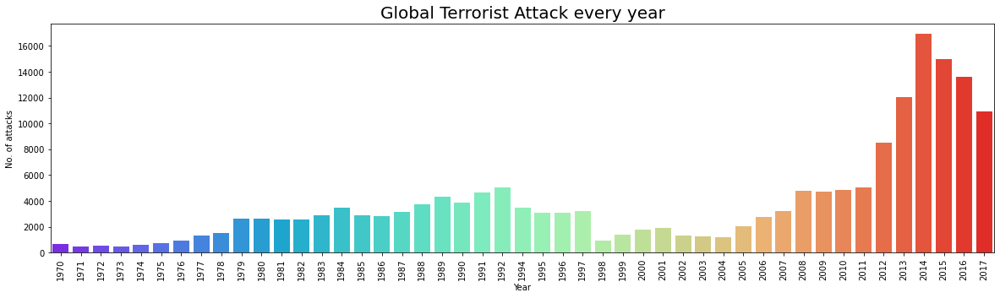

In [20]:
# Create the count plot using seaborn
sns.countplot(x = 'Year' ,data=df, palette = 'rainbow')
# Add title and label the axes
plt.title('Global Terrorist Attack every year', fontsize = 20)
plt.ylabel('No. of attacks')
plt.xticks(rotation = 90) # Rotate the x-axis labels for better visibility
plt.show()

In [21]:
df.Year.value_counts()

2014    16903
2015    14965
2016    13587
2013    12036
2017    10900
2012     8522
2011     5076
1992     5071
2010     4826
2008     4805
2009     4721
1991     4683
1989     4324
1990     3887
1988     3721
1984     3495
1994     3456
2007     3242
1997     3197
1987     3183
1995     3081
1996     3058
1985     2915
1983     2870
1986     2860
2006     2758
1979     2662
1980     2662
1981     2586
1982     2544
2005     2017
2001     1906
2000     1814
1978     1526
1999     1395
2002     1333
1977     1319
2003     1278
2004     1166
1998      934
1976      923
1975      740
1970      651
1974      581
1972      568
1973      473
1971      471
Name: Year, dtype: int64

**Attacks were more during 2014 and then in 2015. When compared to attacks from 1970 onwards, the last 6 years scored a maximum. But from 2014 onwards count started decreasing.**

## Number of Deaths per Year

In [22]:
kill = df.loc[:,'Killed']
print('Total no. of Death by Terror attack : ', int(sum(kill)))

Total no. of Death by Terror attack :  411868


In [23]:
deaths = df.groupby(['Year'])['Killed'].sum()
deaths

Year
1970      174
1971      173
1972      566
1973      370
1974      539
1975      617
1976      674
1977      456
1978     1459
1979     2100
1980     4400
1981     4851
1982     5136
1983     9444
1984    10450
1985     7094
1986     4976
1987     6482
1988     7208
1989     8152
1990     7148
1991     8429
1992     9742
1994     7690
1995     6103
1996     6966
1997    10924
1998     4688
1999     3393
2000     4403
2001     7729
2002     4805
2003     3317
2004     5743
2005     6331
2006     9380
2007    12824
2008     9157
2009     9273
2010     7827
2011     8246
2012    15497
2013    22273
2014    44490
2015    38853
2016    34871
2017    26445
Name: Killed, dtype: int32

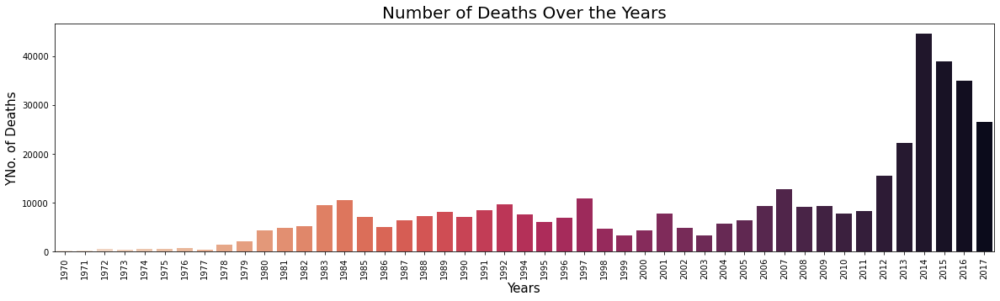

In [24]:
sns.barplot(deaths.index ,deaths, palette = 'rocket_r')
plt.title('Number of Deaths Over the Years', fontsize = 20)
plt.xlabel('Years', fontsize = 15)
plt.ylabel('YNo. of Deaths', fontsize = 15)
plt.xticks(rotation = 90 )
plt.show()

**The year 2014 has the highest number of deaths (44490) by terror attacks.**

## Global Terrorism Heatmap using Plotly Express

In [25]:
# Create a geographical heatmap
fig = px.density_mapbox(df, lat='Latitude', lon='Longitude', z='Killed', radius=10, center=dict(lat=0, lon=180),
                        zoom=0, mapbox_style='stamen-terrain', title='Global Terrorism Heatmap')
fig.show()

## Terrorist Activities in Different Region Year Wise

In [26]:
pd.crosstab(df.Year, df.Region)

Region,Australasia & Oceania,Central America & Caribbean,Central Asia,East Asia,Eastern Europe,Middle East & North Africa,North America,South America,South Asia,Southeast Asia,Sub-Saharan Africa,Western Europe
Year,,,,,,,,,,,,
1970,1,7,0,2,12,28,472,65,1,10,3,50
1971,1,5,0,1,5,55,247,24,0,6,2,125
1972,8,3,0,0,1,53,73,33,1,16,4,376
1973,1,6,0,2,1,19,64,83,1,2,4,290
1974,1,11,0,4,2,42,111,81,2,3,7,317
1975,0,9,0,12,0,44,159,55,4,7,12,438
1976,0,45,0,2,0,55,125,91,4,12,11,578
1977,0,24,0,4,2,211,149,119,2,8,29,771
1978,2,199,0,35,2,128,117,222,2,44,46,729


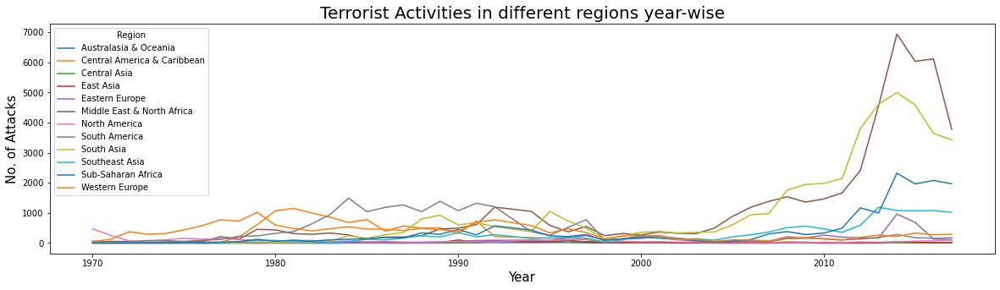

In [27]:
# Create a cross-tabulation of 'Year' and 'Region' and plot it as a line plot
pd.crosstab(df.Year, df.Region).plot(kind='line', stacked=False)
plt.title('Terrorist Activities in different regions year-wise', fontsize=20)
plt.xlabel('Year', fontsize=15)
plt.ylabel('No. of Attacks', fontsize=15)
plt.show()

**The Middle East & North Africa leads 1st among all the regions and then South Asia takes 2nd place.**

## Country Wise Number of Attacks

In [28]:
Attack=df.Country.value_counts()
Attack

Iraq                   24636
Pakistan               14368
Afghanistan            12731
India                  11960
Colombia                8306
                       ...  
International              1
Wallis and Futuna          1
South Vietnam              1
Andorra                    1
Antigua and Barbuda        1
Name: Country, Length: 205, dtype: int64

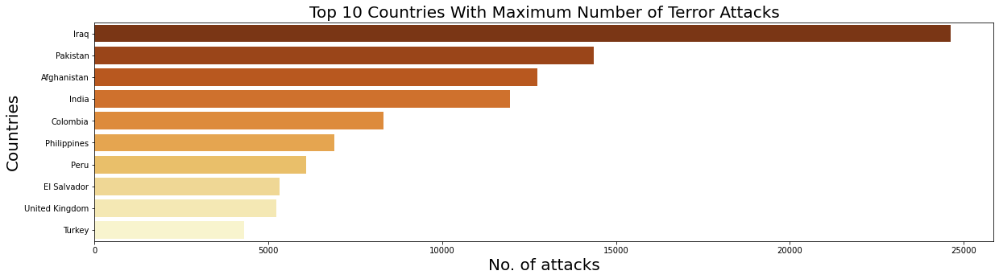

In [29]:
sns.barplot(Attack[:10], Attack[:10].index, palette = 'YlOrBr_r')
plt.title('Top 10 Countries With Maximum Number of Terror Attacks',fontsize=20)
plt.xlabel('No. of attacks',fontsize=20)
plt.ylabel('Countries',fontsize=20)
plt.show()

**Iraq dominates all the countries and it has the highest number of attacks and then Pakistan, Afghanistan, and India follow it. Government should increase safety measures in these countries.**

## Top 10 most attacked states

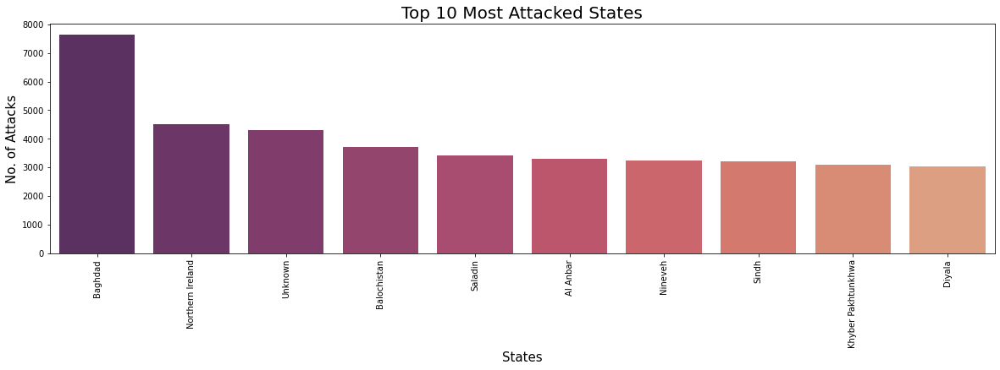

In [30]:
sns.barplot(df.State.value_counts()[:10].index , df.State.value_counts()[:10] , palette = 'flare_r')
plt.title('Top 10 Most Attacked States', fontsize = 20)
plt.xlabel('States', fontsize =15)
plt.ylabel('No. of Attacks', fontsize = 15)
plt.xticks(rotation = 90)
plt.show()

**Baghdad is the most attacked state , followed by Northern Ireland**

## Most Affected Cities

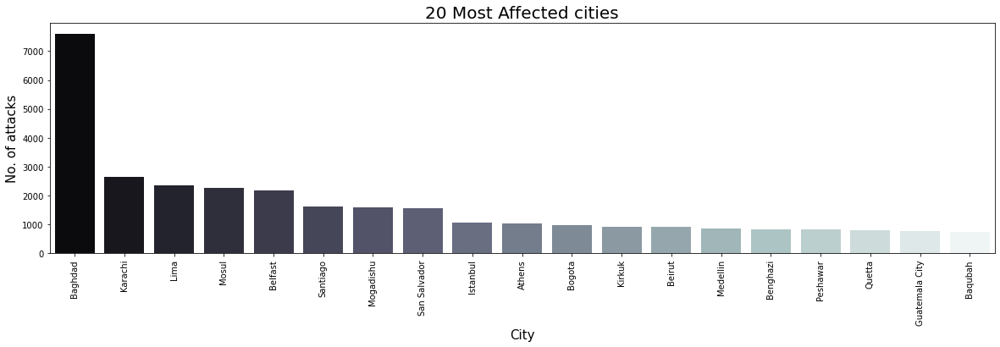

In [31]:
sns.barplot(y=df['City'].value_counts().values[1:20], x=df['City'].value_counts()[1:20].index,palette='bone')
plt.title('20 Most Affected cities',fontsize=20)
plt.xlabel('City',fontsize=15)
plt.ylabel('No. of attacks',fontsize=15)
plt.xticks(rotation = 90)
plt.show()

**Baghdad is the most attacked city followed by Karachi and Lima.**

## Terrorism Based on Target Type

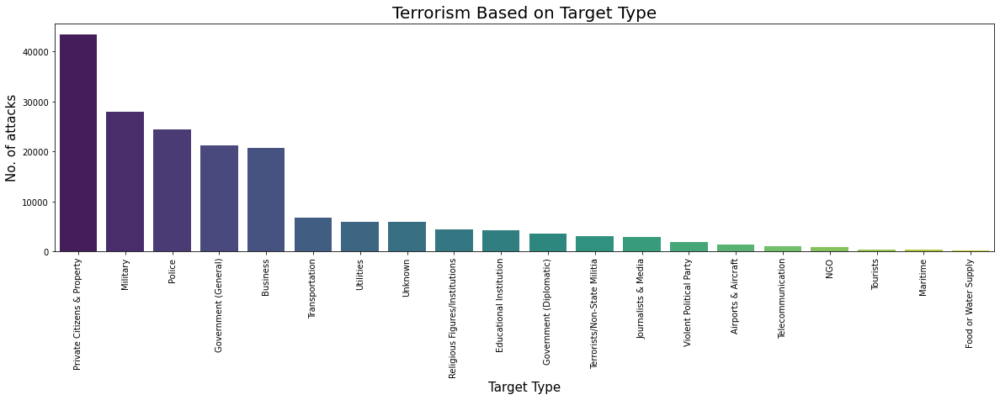

In [32]:
sns.barplot(x = df.Target_Type.value_counts()[:20].index , y =  df.Target_Type.value_counts()[:20] , palette='viridis')
plt.title('Terrorism Based on Target Type',fontsize=20)
plt.xlabel('Target Type',fontsize=15 )
plt.ylabel('No. of attacks',fontsize=15)
plt.xticks(rotation = 90)
plt.show()

**For most of the attacks, the target is Private Citizens & property and the next Military leads.**

## Types of Terrorist Attack

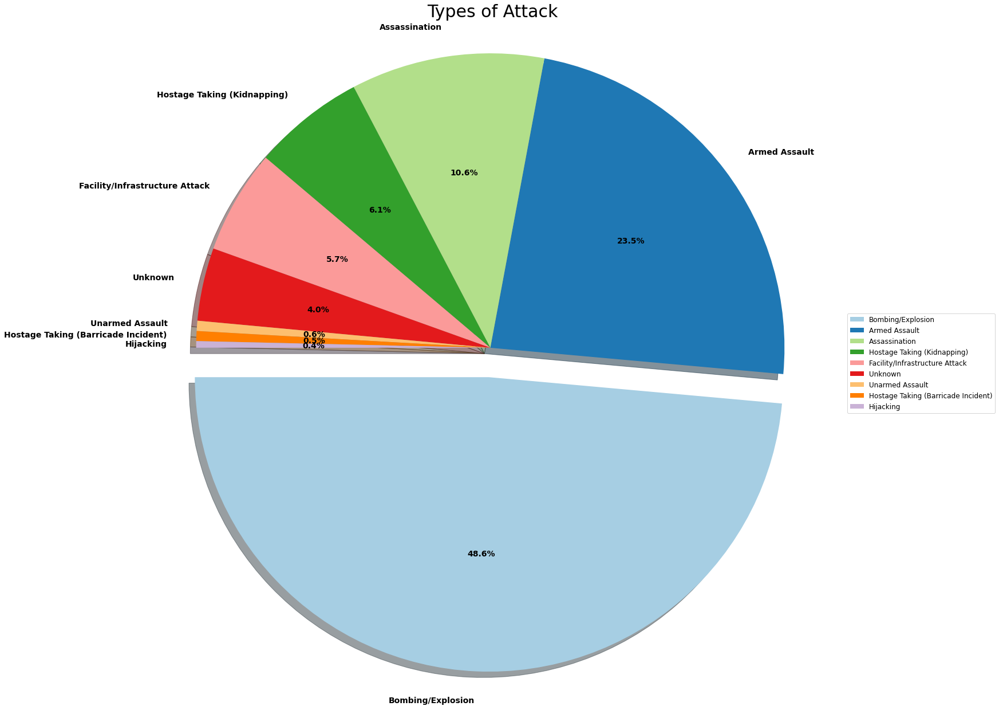

In [33]:
# Get the count of each unique value in the 'Attack_Type' column
attack_counts = df['Attack_Type'].value_counts()

# Create the pie chart for the types of attack
plt.figure(figsize=(22, 22))
plt.pie(attack_counts, labels=attack_counts.index, autopct='%1.1f%%', shadow=True, startangle=180, 
        explode=[0.1, 0, 0, 0, 0, 0, 0, 0, 0],textprops={'fontsize': 14 ,'weight':'bold'} , colors=sns.color_palette('Paired'))
# Set the title for the pie chart
plt.title('Types of Attack', fontsize=30)
# Equal aspect ratio ensures that the pie chart is drawn as a circle.
plt.axis('equal')
# Add a legend to the pie chart
plt.legend(attack_counts.index, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)
# Display the pie chart
plt.show()


**Most of the attacks were through Bombing/Explosion.**

## Types of Weapon used for Terror Attacks

In [34]:
df.Weapon_Type.value_counts()

Explosives                                                                     92426
Firearms                                                                       58524
Unknown                                                                        15157
Incendiary                                                                     11135
Melee                                                                           3655
Chemical                                                                         321
Sabotage Equipment                                                               141
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)      136
Other                                                                            114
Biological                                                                        35
Fake Weapons                                                                      33
Radiological                                                     

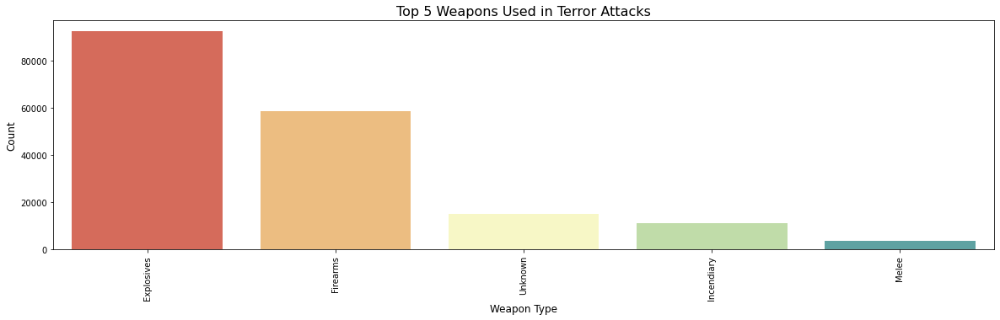

In [35]:
# Create the bar plot for the top 5 weapons
sns.barplot(x=df.Weapon_Type.value_counts()[:5].index, y=df.Weapon_Type.value_counts().values[:5], palette='Spectral')

# Set the labels and title for the bar plot
plt.xlabel('Weapon Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title( 'Top 5 Weapons Used in Terror Attacks', fontsize=16)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Display the bar plot
plt.show()


**Explosives were the most used weapons for Terror Attacks.**

## Number of Deaths and Wounded by Attack Type

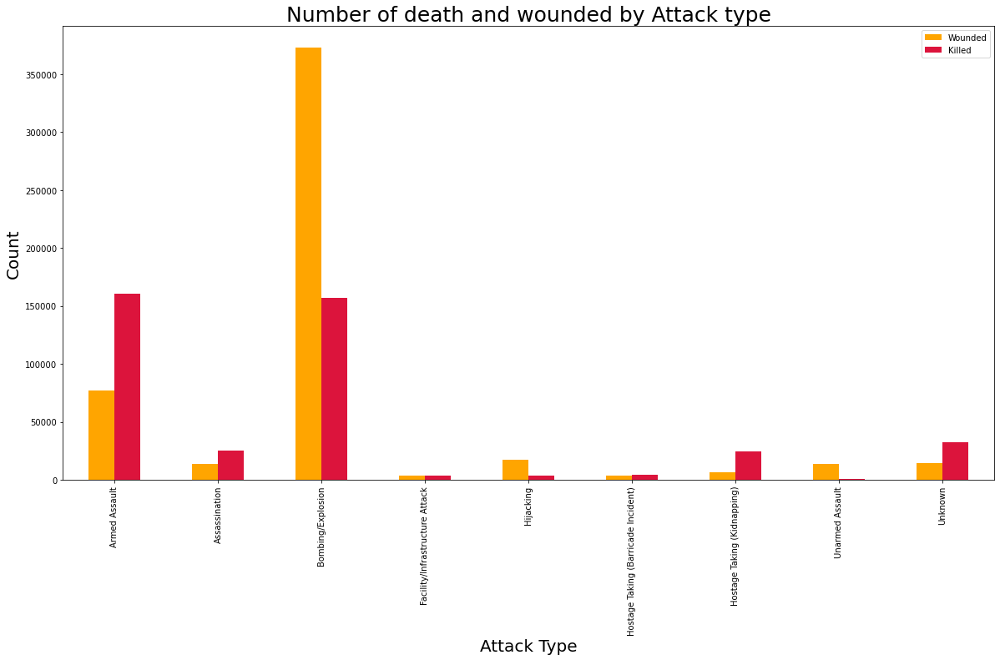

In [36]:
df[['Attack_Type','Wounded','Killed']].groupby(["Attack_Type"],axis=0).sum().plot(kind='bar',figsize=(20,10),color=['orange','crimson'])
plt.xticks(rotation=90)
plt.title('Number of death and wounded by Attack type',fontsize=25)
plt.xlabel('Attack Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.show()

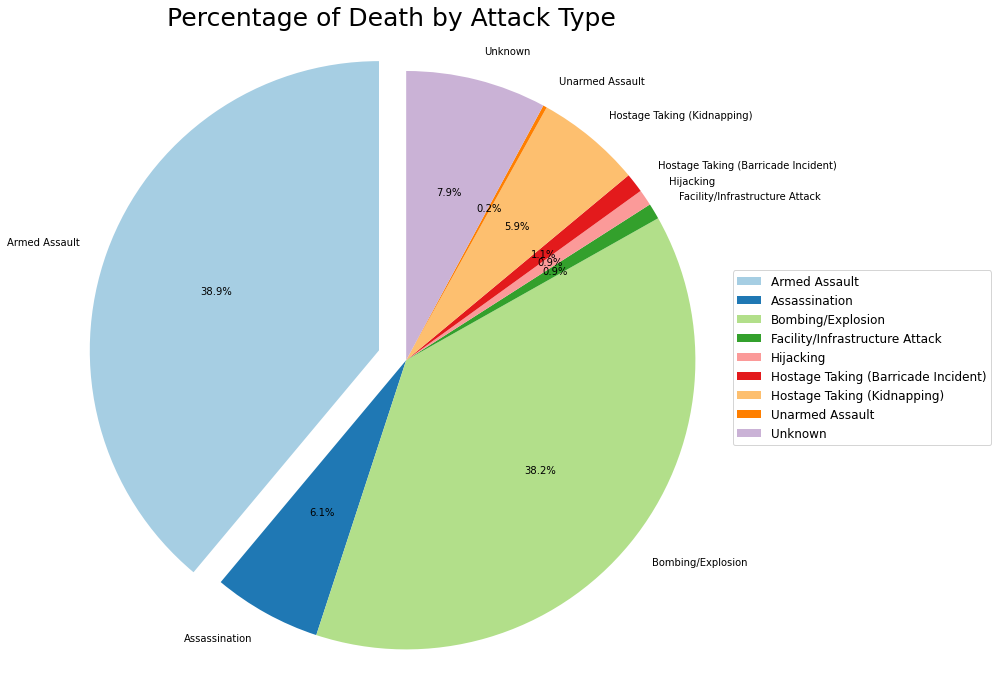

In [37]:
# Group the data by 'Attack_Type' and calculate the sum of 'Killed' for each attack type
killed_data = df.groupby("Attack_Type")['Killed'].sum()

# Create the pie chart
plt.figure(figsize=(12, 12))
plt.pie(killed_data, labels=killed_data.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Paired'), explode=[0.1, 0, 0, 0, 0, 0, 0, 0, 0])
plt.title('Percentage of Death by Attack Type', fontsize=25)

# Equal aspect ratio ensures that the pie chart is drawn as a circle.
plt.axis('equal')

# Add a legend to the pie chart
plt.legend(killed_data.index, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)

# Display the pie chart
plt.show()


**Maximum number of death was caused by Armed Assault (38.9%) , followed by Bombing/Explosion.**

## Number of Deaths and Wounded  in Attacked Regions and Countries

In [38]:
r_killed = df[['Region', 'Wounded', 'Killed']].groupby(["Region"], axis=0).sum().sort_values(by='Killed', ascending=False)
r_killed 

,Wounded,Killed
Region,,
Middle East & North Africa,214308,137642
South Asia,141360,101319
Sub-Saharan Africa,52856,78386
South America,16704,28849
Central America & Caribbean,8991,28708
Southeast Asia,26259,15637
Eastern Europe,12045,7415
Western Europe,18332,6694
North America,21531,4916


In [39]:
c_killed = df[['Country', 'Wounded', 'Killed']].groupby(["Country"], axis=0).sum().sort_values(by='Killed', ascending=False)
c_killed

,Wounded,Killed
Country,,
Iraq,134690,78589
Afghanistan,44277,39384
Pakistan,42038,23822
Nigeria,10238,22682
India,28980,19341
...,...,...
St. Kitts and Nevis,9,0
Martinique,1,0
Brunei,1,0


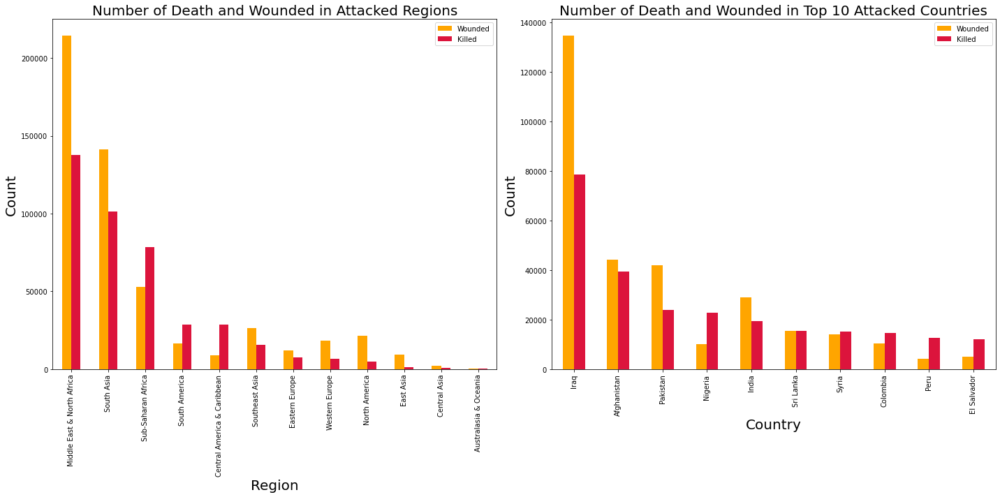

In [40]:
# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Subplot 1: Bar chart for wounded and killed people in different regions
df['Wounded'] = df['Wounded'].astype(float)
df['Killed'] = df['Killed'].astype(float)
r_killed .plot(kind='bar', ax=axes[0], color=['orange', 'crimson'])
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)
axes[0].set_title('Number of Death and Wounded in Attacked Regions', fontsize=20)
axes[0].set_xlabel('Region', fontsize=20)
axes[0].set_ylabel('Count', fontsize=20)

# Subplot 2: Bar chart for wounded and killed people in the top 10 attacked countries
c_killed.head(10).plot(kind='bar', ax=axes[1], color=['orange', 'crimson'])
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90)
axes[1].set_title('Number of Death and Wounded in Top 10 Attacked Countries', fontsize=20)
axes[1].set_xlabel('Country', fontsize=20)
axes[1].set_ylabel('Count', fontsize=20)

# Display the subplots
plt.tight_layout()
plt.show()

## Types of Terrorist Groups

In [41]:
df.Group.value_counts()[:20]

Unknown                                             82782
Taliban                                              7478
Islamic State of Iraq and the Levant (ISIL)          5613
Shining Path (SL)                                    4555
Farabundo Marti National Liberation Front (FMLN)     3351
Al-Shabaab                                           3288
New People's Army (NPA)                              2772
Irish Republican Army (IRA)                          2671
Revolutionary Armed Forces of Colombia (FARC)        2487
Boko Haram                                           2418
Kurdistan Workers' Party (PKK)                       2310
Basque Fatherland and Freedom (ETA)                  2024
Communist Party of India - Maoist (CPI-Maoist)       1878
Maoists                                              1630
Liberation Tigers of Tamil Eelam (LTTE)              1606
National Liberation Army of Colombia (ELN)           1561
Tehrik-i-Taliban Pakistan (TTP)                      1351
Palestinians  

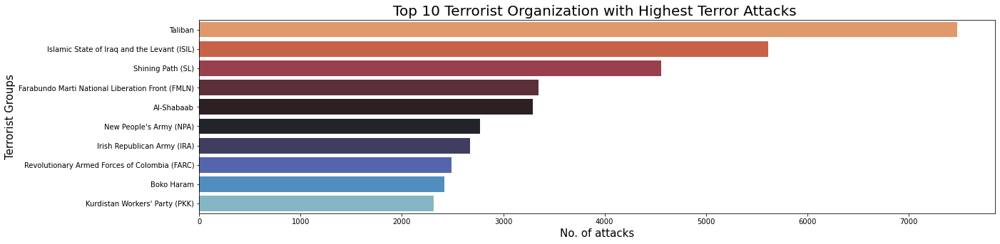

In [42]:
sns.barplot(df.Group.value_counts()[1:11],df.Group.value_counts()[1:11].index , palette = 'icefire_r')
plt.title('Top 10 Terrorist Organization with Highest Terror Attacks ',fontsize=20)
plt.xlabel('No. of attacks',fontsize=15 )
plt.ylabel('Terrorist Groups',fontsize=15)
plt.show()

**The Terrorist Organization 'Taliban' has caused the highest number of terror attacks (7478).**

## Analysis of Terror Attacks by Taliban 

In [43]:
# Creating a new dataframe containing Group Taliban 

df_tali = df[df.Group == 'Taliban']

### Terror Attacks by Taliban Over the Years

In [44]:
df_tali.Year.value_counts()

2015    1249
2016    1065
2014    1035
2017     894
2012     800
2013     775
2010     308
2009     268
2008     258
2011     214
2007     208
2006     164
2005     120
2004      55
2003      50
2002       7
2001       4
1995       4
Name: Year, dtype: int64

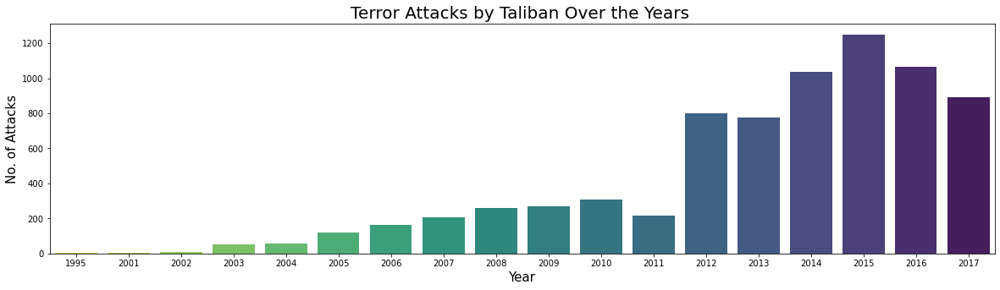

In [45]:
sns.countplot(x = 'Year', data = df_tali  , palette = 'viridis_r')
plt.title('Terror Attacks by Taliban Over the Years ',fontsize=20)
plt.xlabel('Year',fontsize=15 )
plt.ylabel('No. of Attacks',fontsize=15)
plt.show()

**Maximum terror attacks (1249 attacks) were caused by Taliban was in the year 2015.**

### People Killed and Wounded by Taliban Over the Years 

In [46]:
df_tali[['Year','Wounded','Killed']].groupby(["Year"],axis=0).sum()

,Wounded,Killed
Year,,
1995,0.0,0.0
2001,1.0,153.0
2002,4.0,5.0
2003,131.0,86.0
2004,129.0,192.0
2005,200.0,293.0
2006,485.0,477.0
2007,512.0,747.0
2008,612.0,753.0


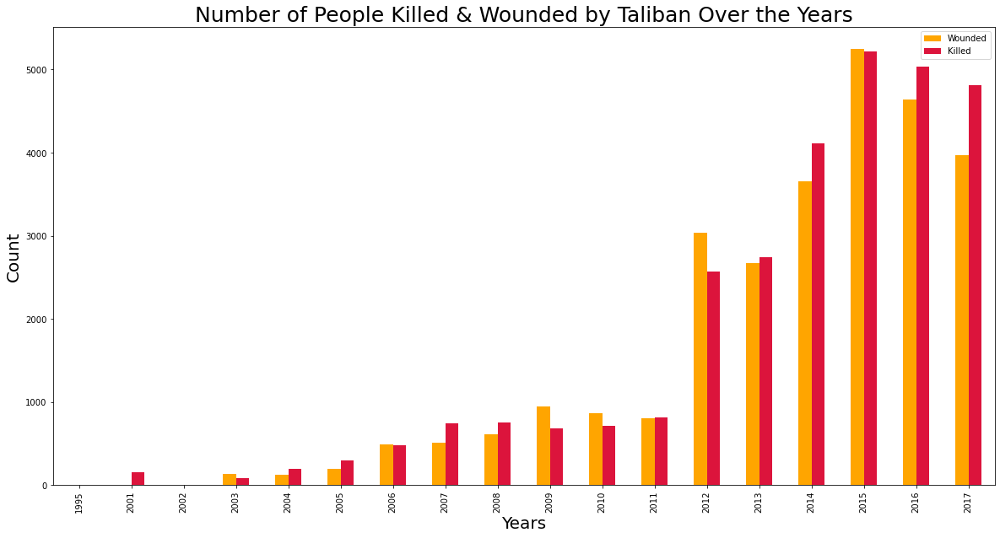

In [47]:
df_tali[['Year','Wounded','Killed']].groupby(["Year"],axis=0).sum().plot(kind='bar',figsize=(20,10),color=['orange','crimson'])
plt.xticks(rotation=90)
plt.title('Number of People Killed & Wounded by Taliban Over the Years',fontsize=25)
plt.xlabel('Years', fontsize =20)
plt.ylabel('Count',fontsize=20)
plt.show()

* No. Of people killed by Taliban in Year 2015 : 5220
* No. Of people wounded by Taliban in Year 2015 : 5225

 ### We shall now analyze the terror activities that took place during 2014 ,since it is the peak year for the Terror Attacks.

## Terror Activities During the Peak Year 2014

In [48]:
#Creating a new dataframe for the year 2014

df_2014 = df[df.Year == 2014]
df_2014.head(50)

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,Attack_Type,Weapon_Type,Target_Type,Target,Group,Killed,Wounded
125335,2014,1,1,Colombia,Norte de Santander,South America,Convencion,8.868790,-73.194094,Bombing/Explosion,Explosives,Utilities,Crude Oil Holding Pools,National Liberation Army of Colombia (ELN),0.0,0.0
125336,2014,1,1,Somalia,Banaadir,Sub-Saharan Africa,Mogadishu,2.059819,45.326115,Bombing/Explosion,Explosives,Business,Hotel,Al-Shabaab,4.0,20.0
125337,2014,1,1,Pakistan,Balochistan,South Asia,Quetta,30.200819,66.994354,Bombing/Explosion,Explosives,Private Citizens & Property,Shia Pilgrims,Jaish-e-Islam,3.0,31.0
125338,2014,1,1,Pakistan,Balochistan,South Asia,Dera Bugti,29.034412,69.158661,Bombing/Explosion,Explosives,Unknown,Unknown,Unknown,0.0,0.0
125339,2014,1,1,Somalia,Middle Juba,Sub-Saharan Africa,Buale,1.097128,42.598368,Hostage Taking (Kidnapping),Unknown,NGO,Aid Workers,Al-Shabaab,0.0,0.0
125340,2014,1,1,Iraq,Nineveh,Middle East & North Africa,Mosul,36.354145,43.143570,Bombing/Explosion,Explosives,Military,Patrol,Unknown,2.0,6.0
125341,2014,1,1,Iraq,Saladin,Middle East & North Africa,Yathrib,33.994591,44.357273,Armed Assault,Firearms,Military,Checkpoint,Unknown,2.0,3.0
125342,2014,1,1,Iraq,Saladin,Middle East & North Africa,Tarmiyah,33.669689,44.381317,Armed Assault,Firearms,Police,Police Station,Muslim extremists,4.0,12.0
125343,2014,1,1,India,Manipur,South Asia,Singjamei,24.798346,93.940430,Bombing/Explosion,Explosives,Unknown,Unknown,Unknown,0.0,0.0
125344,2014,1,1,India,Manipur,South Asia,Imphal,24.798346,93.940430,Bombing/Explosion,Explosives,Unknown,Unknown,Unknown,0.0,0.0


### Regions & Countries That Were Attacked the Most

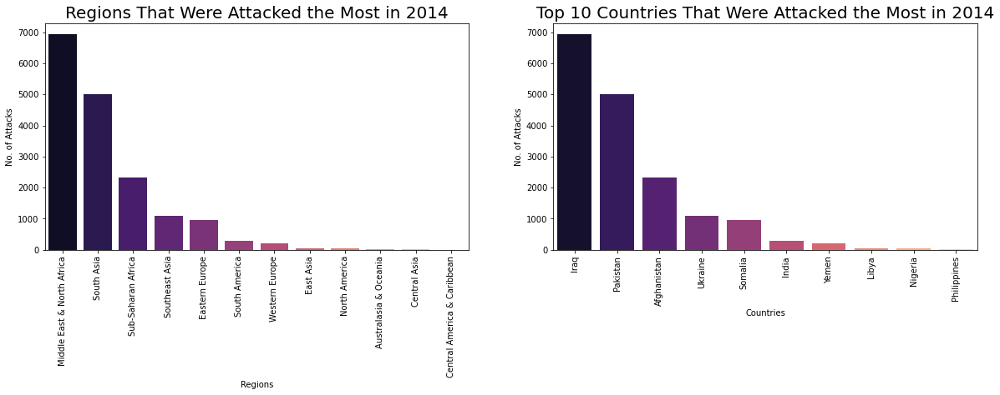

In [49]:
# Regions that were attacked more in 2014
plt.subplot(1,2,1)
sns.barplot(df_2014.Region.value_counts().index, df_2014.Region.value_counts(), palette = 'magma' )
plt.xticks(rotation = 90)
plt.title("Regions That Were Attacked the Most in 2014" , fontsize = 20)
plt.xlabel("Regions")
plt.ylabel("No. of Attacks")

#Top 10 countries that were attacked the most in the year 2014
plt.subplot(1,2,2)
sns.barplot(df_2014.Country.value_counts()[:10].index, df_2014.Region.value_counts()[:10], palette = 'magma' )
plt.xticks(rotation = 90)
plt.title("Top 10 Countries That Were Attacked the Most in 2014" , fontsize = 20)
plt.xlabel("Countries")
plt.ylabel("No. of Attacks")
plt.show()

With the above graphs we can conclude that :-
* In 2014 the most affected region is  Middle East and North Africa, followed by South Asia
* In 2014 the most affected country is Iraq , follwed by Pakistan


### Countries With Maximum People Killed & Wounded in 2014

In [50]:
df_2014.groupby(['Country'])["Killed"].sum().sort_values(ascending =False).head(20) 

Country
Iraq                                13965.0
Nigeria                              7781.0
Afghanistan                          5414.0
Syria                                3312.0
Pakistan                             2413.0
Somalia                              1589.0
Ukraine                              1396.0
Yemen                                1353.0
South Sudan                           908.0
Cameroon                              789.0
Central African Republic              751.0
Libya                                 694.0
Sudan                                 546.0
India                                 490.0
Philippines                           472.0
Democratic Republic of the Congo      366.0
Egypt                                 343.0
China                                 322.0
Kenya                                 315.0
Thailand                              192.0
Name: Killed, dtype: float64

In [51]:
df_2014.groupby(['Country'])["Wounded"].sum().sort_values(ascending =False).head(20)

Country
Iraq                        16804.0
Afghanistan                  5111.0
Pakistan                     3388.0
Nigeria                      2283.0
Syria                        2014.0
Yemen                        1305.0
Ukraine                      1226.0
Libya                         895.0
Somalia                       780.0
India                         776.0
Philippines                   723.0
Thailand                      651.0
South Sudan                   602.0
Egypt                         548.0
Lebanon                       532.0
China                         478.0
Kenya                         408.0
Sudan                         320.0
Colombia                      314.0
Central African Republic      298.0
Name: Wounded, dtype: float64

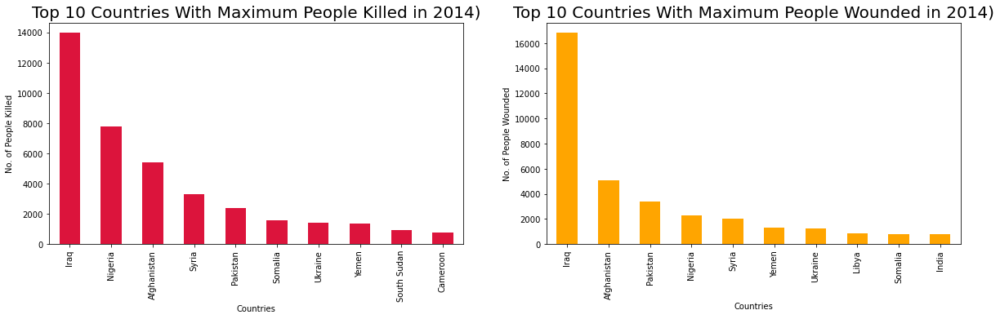

In [52]:
plt.subplot(1,2,1)
df_2014.groupby(['Country'])["Killed"].sum().sort_values(ascending =False).head(10).plot(kind = 'bar' , color = 'crimson')
plt.xticks(rotation = 90)
plt.title("Top 10 Countries With Maximum People Killed in 2014)" , fontsize = 20)
plt.xlabel("Countries")
plt.ylabel("No. of People Killed")

#Top 10 countries that were attacked the most in the year 2014
plt.subplot(1,2,2)
df_2014.groupby(['Country'])["Wounded"].sum().sort_values(ascending =False).head(10).plot(kind = 'bar' , color = 'orange')
plt.xticks(rotation = 90)
plt.title("Top 10 Countries With Maximum People Wounded in 2014)" , fontsize = 20)
plt.xlabel("Countries")
plt.ylabel("No. of People Wounded")
plt.show()

**The country Iraq has the  maximum number of people killed and wounded  in the year 2014**

## Analysis of Terrorism in India


In [53]:
# Creating a new dataframe for the country India
df_India = df[df.Country == 'India']

### Year Wise Terrorism in India

In [54]:
df_India.Year.value_counts().head()

2016    1025
2017     966
2015     884
2014     860
2013     694
Name: Year, dtype: int64

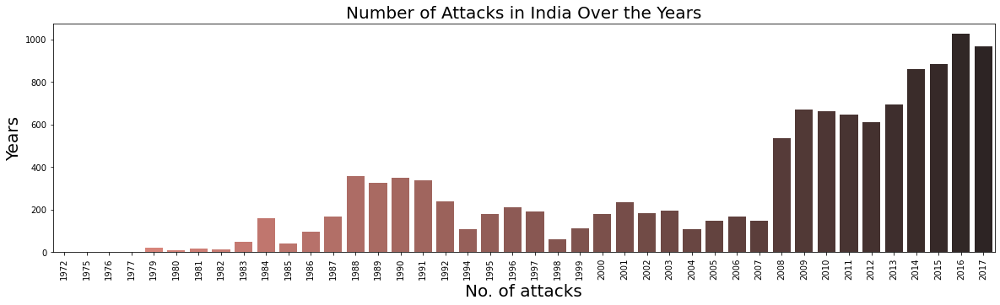

In [55]:
sns.countplot(x = 'Year' , data = df_India , palette = 'dark:salmon_r')
plt.title('Number of Attacks in India Over the Years',fontsize=20)
plt.xlabel('No. of attacks',fontsize=20)
plt.ylabel('Years',fontsize=20)
plt.xticks(rotation = 90)
plt.show()

**India witnessed the maximum terror attacks in the year 2016**

### Number of People Killed In India Over the Years

In [56]:
total_killed_in_India = df_India.loc[:,'Killed']
print('Total no. of Death by Terror attack in India : ', int(sum(total_killed_in_India)))

Total no. of Death by Terror attack in India :  19341


In [57]:
df_India.groupby(['Year'])["Killed"].sum()

Year
1972       0.0
1975       4.0
1976       0.0
1977       0.0
1979      31.0
1980      17.0
1981      24.0
1982      64.0
1983      59.0
1984     195.0
1985      51.0
1986     340.0
1987     506.0
1988     966.0
1989     874.0
1990     907.0
1991    1113.0
1992    1152.0
1994     389.0
1995     361.0
1996     569.0
1997     853.0
1998     398.0
1999     469.0
2000     671.0
2001     660.0
2002     599.0
2003     472.0
2004     334.0
2005     466.0
2006     722.0
2007     626.0
2008     824.0
2009     774.0
2010     812.0
2011     499.0
2012     264.0
2013     467.0
2014     490.0
2015     387.0
2016     467.0
2017     465.0
Name: Killed, dtype: float64

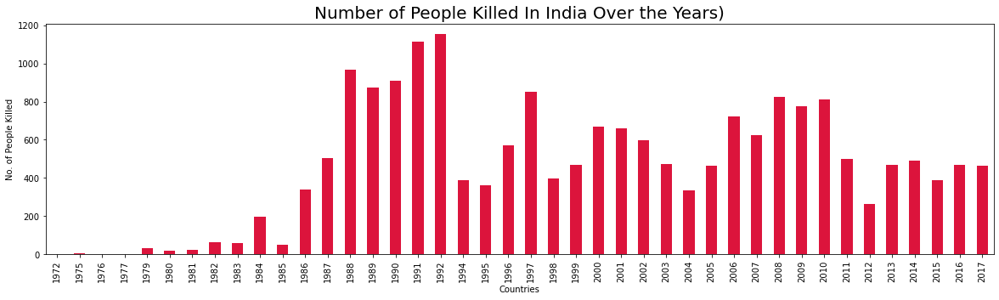

In [58]:
df_India.groupby(['Year'])["Killed"].sum().plot(kind = 'bar' , color = 'crimson')
plt.xticks(rotation = 90)
plt.title("Number of People Killed In India Over the Years)" , fontsize = 20)
plt.xlabel("Countries")
plt.ylabel("No. of People Killed")
plt.show()


### Number of People Killed In India Over the Years

In [59]:
df_India.groupby(['Year'])["Wounded"].sum()

Year
1972       0.0
1975       0.0
1976       0.0
1977       0.0
1979      19.0
1980      13.0
1981      12.0
1982     102.0
1983     217.0
1984     364.0
1985      79.0
1986     163.0
1987     429.0
1988    1033.0
1989     769.0
1990    1042.0
1991    1326.0
1992     917.0
1994     405.0
1995     616.0
1996     952.0
1997    1416.0
1998     411.0
1999     591.0
2000     761.0
2001    1144.0
2002    1186.0
2003    1183.0
2004     949.0
2005    1216.0
2006    2138.0
2007    1187.0
2008    1759.0
2009     854.0
2010     660.0
2011     730.0
2012     651.0
2013     771.0
2014     776.0
2015     649.0
2016     788.0
2017     702.0
Name: Wounded, dtype: float64

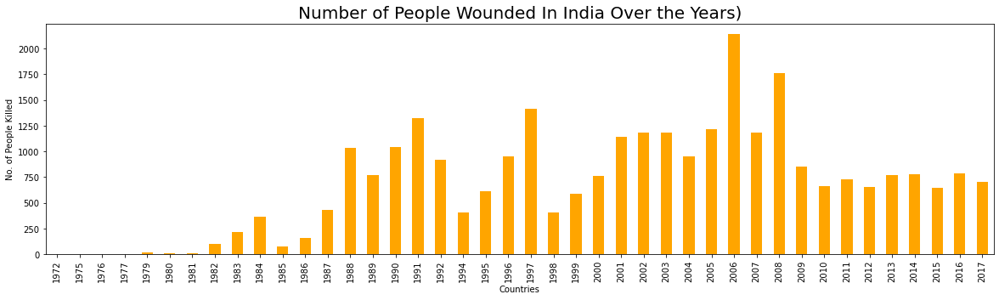

In [60]:
df_India.groupby(['Year'])["Wounded"].sum().plot(kind = 'bar' , color = 'orange')
plt.xticks(rotation = 90)
plt.title("Number of People Wounded In India Over the Years)" , fontsize = 20)
plt.xlabel("Countries")
plt.ylabel("No. of People Killed")
plt.show()


### Terrorism Heatmap for India using Plotly Express

In [61]:
fig = px.density_mapbox(df_India, lat='Latitude', lon='Longitude', z='Killed', radius=10, center=dict(lat=20, lon=78),
                        zoom=4, mapbox_style='stamen-terrain',
                        title='Terrorism Heatmap in India')
fig.show()

### Cities With Maximum Terror Attacks

In [62]:
df_India.City.value_counts()

Srinagar          658
Unknown           624
Imphal            426
New Delhi         157
Amritsar          138
                 ... 
Bhagirath Para      1
Leimakhong          1
Halwara             1
Banka               1
Hungrum             1
Name: City, Length: 4798, dtype: int64

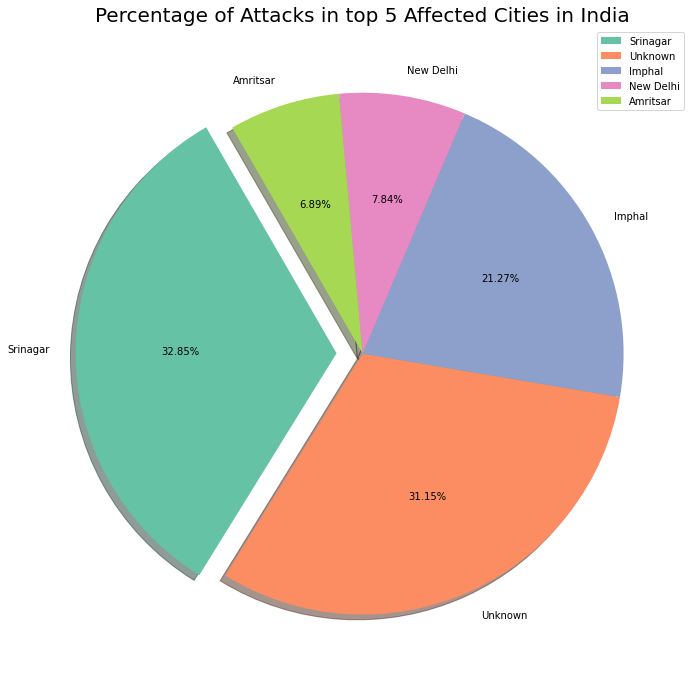

In [63]:
plt.figure(figsize=(12, 12))
plt.pie(df_India.City.value_counts()[:5], labels=df_India.City.value_counts()[:5].index,autopct='%1.2f%%', shadow=True, 
        startangle=120 ,explode=[0.1,0.0,0.0,0.0, 0.0], colors=sns.color_palette('Set2'))

# Set the title for the pie chart
plt.title('Percentage of Attacks in top 5 Affected Cities in India', fontsize=20)
plt.legend(loc = 'best')

# Display the pie chart
plt.show()

**City with the maximum terror attack in India was Srinagar.**

In [64]:
df_India.Weapon_Type.value_counts()

Explosives                                                                     5030
Firearms                                                                       4530
Incendiary                                                                      930
Unknown                                                                         908
Melee                                                                           502
Sabotage Equipment                                                               32
Chemical                                                                         12
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)       7
Other                                                                             7
Fake Weapons                                                                      2
Name: Weapon_Type, dtype: int64

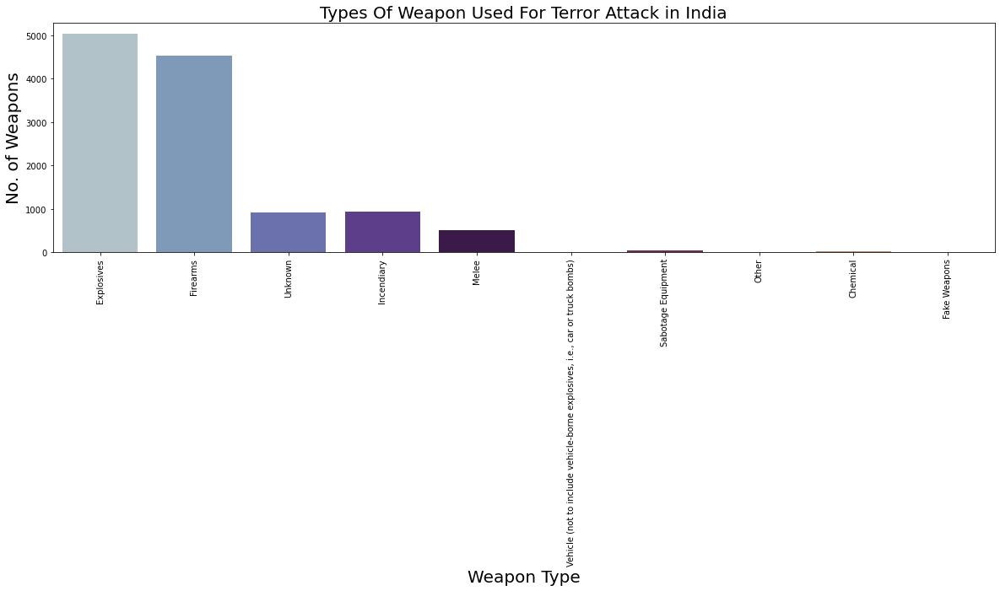

In [65]:
sns.countplot(x = 'Weapon_Type', data = df_India, palette = 'twilight' )
plt.title('Types Of Weapon Used For Terror Attack in India',fontsize=20)
plt.xlabel('Weapon Type',fontsize=20)
plt.ylabel('No. of Weapons',fontsize=20)
plt.xticks(rotation = 90)
plt.show()

**Explosives were the most used weapons for terrorism in India**

# Conclusion

#### After performing the Exploratory Data Analysis , we get the following insights from the data :

* Total Death so far : 411868
* Year with most attack : 2014 (16903 attacks in this year , which means on an average 46 attacks per day
* Year with the most number of deaths : 2014 , deaths - 44490
* Most affected region across the globe : Middle East & North Africa, South Asia
* Most affected Country : Iraq
* Most affected city and state : Baghdad
* Most used Attack Type : bombing / Explosive
* The Attack Type which caused most deaths : Armed Assualt
* Most targeted segment was  Private Citizens & property , followed by  Military, Police, Government
* Explosives have been consistently the most popular choice of weapons for the terrorists.
* Most active terrorist group : Taliban (caused 7478 terror attacks)
* The year in which Taliban caused the maximum terror attacks : 2015 (more than 1200)
* Taliban killed 5220 and also wounded 5225 people during 2015 ,after that a decreasing trend could be seen   but still the       numbers are quite high.
* In 2014 the most affected region is Middle East and North Africa, followed by South Asia.
* In 2014 the most affected country is Iraq , follwed by Pakistan.
* In 2014 the country Iraq had the maximum number of people killed and wounded. 
* Total no. of death by terror attack in India :  19341
* Year with the most Terror Attack in India : 2016
* In 1992 India had the maximum number of people killed and in 2006 , it had maximum number of people wounded. 
* Most effected city in India : Srinagar
* Commonly used weapons by terrorist in India : Explosive & Firearms

#### Recommendations

* Since the Private Citizens and the Property are being targeted consistently , so stronger security and survelliance should be   provided, especially in the dense populated region.
* More survelliance and security is required in Middle East & North African regions.
* Strict border policy should be implemented to prevent the movement of explosives between the regions.
